<a href="https://colab.research.google.com/github/JohnTichenor/Locating-Bacterial-Flagellar-Motors/blob/main/Faster_RCNN_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install torch torchvision
!pip install tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 92.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 90.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 106.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjit

## Import Dependencies

In [16]:
# ==== PyTorch Core ====
import torch
from torch.utils.data import DataLoader, Dataset, random_split, Subset

# ==== TorchVision for Computer Vision ====
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn  # Prebuilt Faster R-CNN model
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor  # Custom predictor head
import torchvision.transforms.v2 as T  # v2 transforms for detection tasks (handle boxes/labels)
from torchvision.datasets import ImageFolder  # For quick folder-based datasets

# ==== Data Handling and Utilities ====
from PIL import Image  # Image loading/manipulation
import json  # JSON file reading/writing
import os  # Operating system utilities
import numpy as np  # Numerical computations
import pandas as pd  # DataFrame support

# ==== Progress Bars and Parallel Processing ====
from tqdm.notebook import tqdm  # Jupyter-friendly progress bar
import threading  # Threading for concurrent tasks
from contextlib import nullcontext  # Context manager utility
from concurrent.futures import ThreadPoolExecutor  # For thread pools
import time  # Timing utilities

# ==== Visualization ====
import matplotlib.pyplot as plt  # Plotting
import matplotlib.patches as patches

# ==== Metrics ====
from sklearn.metrics import fbeta_score  # F-beta metric for evaluation

import cv2  # OpenCV for advanced image and video operations


## Mount Drive

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


## Load Data

In [4]:
TRAIN_DIR = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/train"
TEST_DIR = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/test"
LABELS_PATH = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/train_labels.csv"
SUBMIT_PATH = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/submission.csv"
BOUNDING_BOXES_PATH = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/bounding_boxes_32.json"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Find out Image type

In [9]:
img = Image.open(TEST_DIR + "/tomo_00e047/slice_0000.jpg")
print(img.mode)  # Outputs 'RGB', 'L', 'RGBA', etc.

if img.mode == 'RGB':
    print("Image is RGB (3 channels)")
elif img.mode == 'L':
    print("Image is grayscale (1 channel)")
else:
    print(f"Image mode is: {img.mode}")


L
Image is grayscale (1 channel)


## Create Bounding Boxes

In [5]:
def create_motor_bounding_boxes(csv_path, output_json_path, box_size=32):
    """
    Convert 3D motor coordinates into 2D bounding boxes and save as JSON.
    For slices with no motor, adds an empty list (no bounding boxes).

    Args:
        csv_path (str): Path to the CSV file with motor annotations.
        output_json_path (str): Path to save the output JSON file.
        box_size (int): Width/height of the bounding box (in pixels). Default is 32.

    Returns:
        str: Path to the saved JSON file.
    """
    if os.path.exists(output_json_path):
        print(f"⚠️ JSON already exists at '{output_json_path}'. Skipping creation.")
        return output_json_path

    df = pd.read_csv(csv_path)
    half = box_size // 2
    bbox_dict = {}

    for _, row in df.iterrows():
        z = row["Motor axis 0"]
        y = row["Motor axis 1"]
        x = row["Motor axis 2"]
        tomo_id = row["tomo_id"]
        has_motor = row.get("Has motor", 1)  # Default to 1 if not present

        if has_motor == 0 or z < 0 or x < 0 or y < 0:
            # No motor: empty list for this image
            image_filename = f"{tomo_id}/slice_0000.jpg"
            bbox_dict[image_filename] = []
            continue

        image_filename = f"{tomo_id}/slice_{int(z):04d}.jpg"

        # Compute bounding box coordinates centered at (x, y)
        xmin = max(0, int(x - half))
        ymin = max(0, int(y - half))
        xmax = int(x + half)
        ymax = int(y + half)

        # Append annotation for actual motor
        bbox = [xmin, ymin, xmax, ymax]
        label = 1

        if image_filename not in bbox_dict:
            bbox_dict[image_filename] = []

        bbox_dict[image_filename].append({"bbox": bbox, "label": label})

    # Write to JSON
    with open(output_json_path, "w") as f:
        json.dump(bbox_dict, f, indent=2)

    return output_json_path

# Bounding Box Output Path "bounding_boxes_<box_size>.json"
bounding_boxes_json = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/bounding_boxes_32.json"

create_motor_bounding_boxes(LABELS_PATH, bounding_boxes_json, box_size=32)

⚠️ JSON already exists at '/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/bounding_boxes_32.json'. Skipping creation.


'/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/bounding_boxes_32.json'

## Explore Bounding Box json Contents

In [6]:
import json

with open ("/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/bounding_boxes_32.json") as f:   # Replace with your filename
    bbox_dict = json.load(f)

# Extract folder names from each image path
folders = set(path.split('/')[0] for path in bbox_dict.keys())
print("Number of unique tomogram folders referenced:", len(folders))
print("Sample folders:", list(folders)[:10])


Number of unique tomogram folders referenced: 648
Sample folders: ['tomo_cf53d0', 'tomo_7a9b64', 'tomo_317656', 'tomo_6733fa', 'tomo_a81e01', 'tomo_651ec2', 'tomo_be4a3a', 'tomo_3a8480', 'tomo_6607ec', 'tomo_b9088c']


## Visualize Bounding Boxes

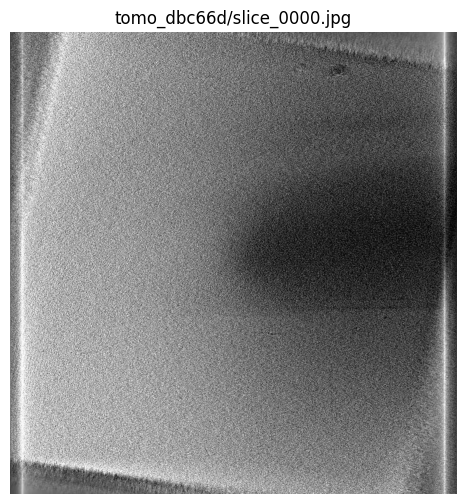

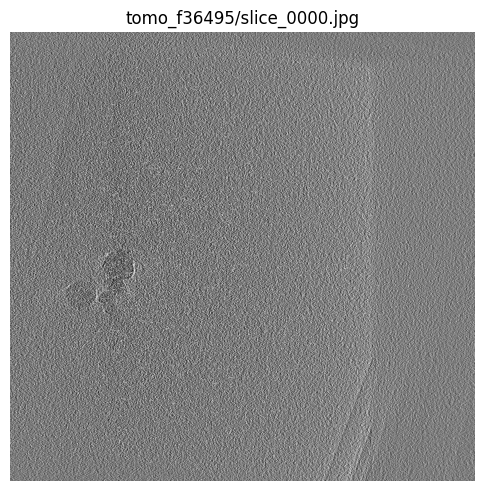

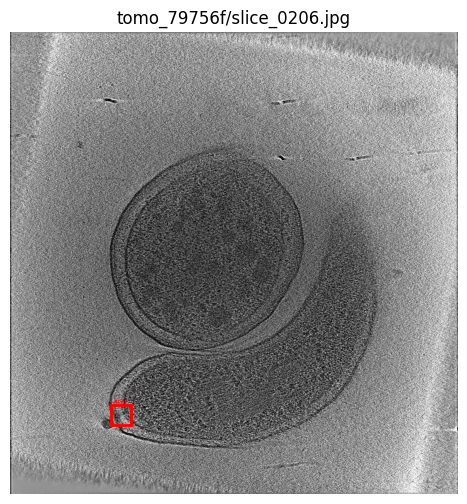

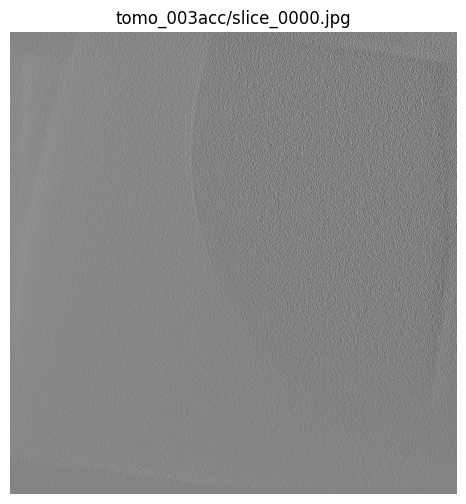

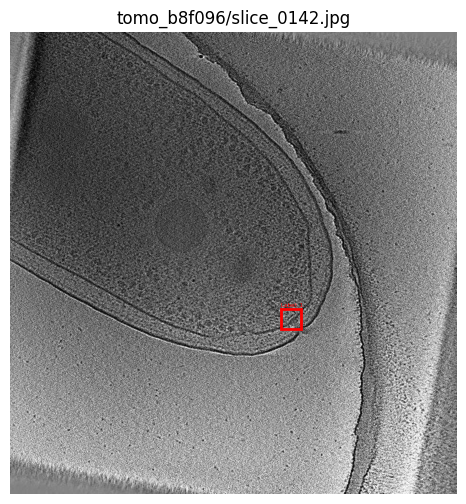

...

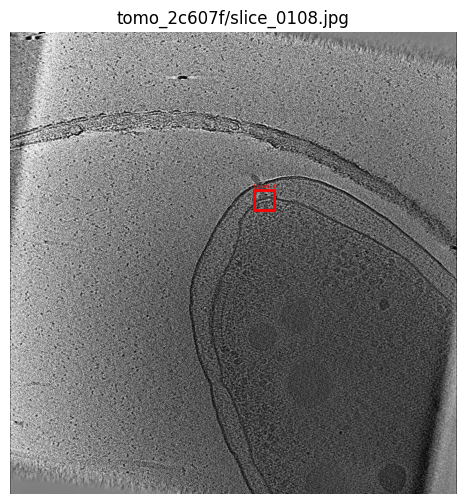

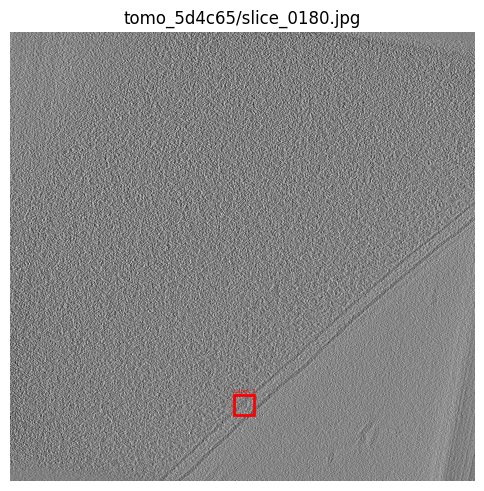

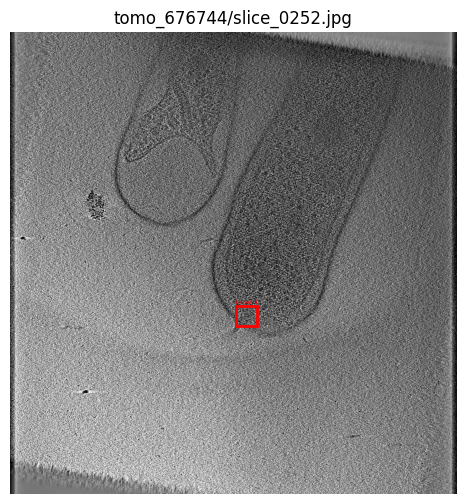

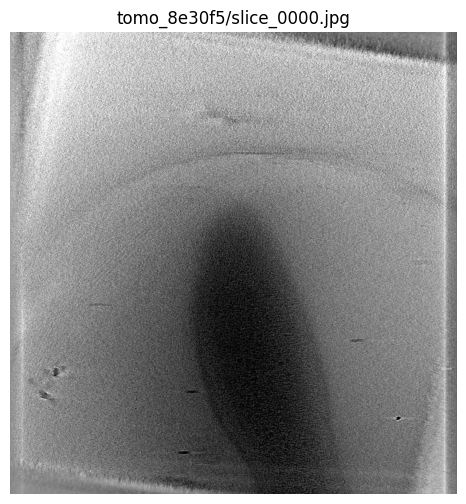

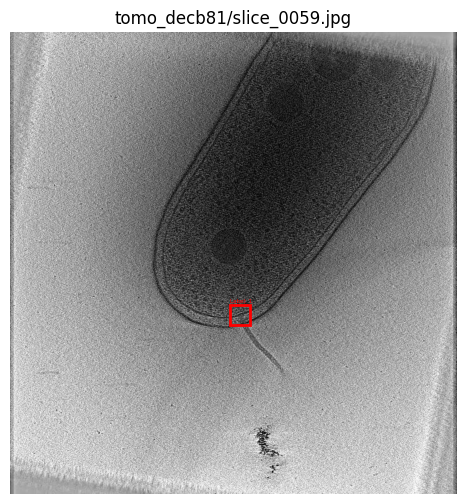

In [9]:
import random
import matplotlib.pyplot as plt
from PIL import Image

def visualize_bounding_boxes(json_path, root_dir, n=5, padding = 0):
    """
    Visualize bounding boxes from JSON on randomly selected image slices.

    Args:
        json_path (str): Path to the JSON file containing bounding boxes.
        root_dir (str): Root directory containing image folders (e.g., tomo_id/slice_xxxx.jpg).
        n (int): Number of images to visualize.
    """
    # Load the bounding box annotations
    with open(json_path, "r") as f:
        bbox_dict = json.load(f)

    # Select random N image filenames
    image_files = random.sample(list(bbox_dict.keys()), min(n, len(bbox_dict)))

    for img_rel_path in image_files:
        img_path = os.path.join(root_dir, img_rel_path)
        if not os.path.exists(img_path):
            print(f"Image not found: {img_path}")
            continue

        img = Image.open(img_path).convert("RGB")

        # Plot the image
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        ax = plt.gca()

        for ann in bbox_dict[img_rel_path]:
          xmin, ymin, xmax, ymax = ann["bbox"]
          # Expand box for visualization
          xmin_p = max(xmin - padding, 0)
          ymin_p = max(ymin - padding, 0)
          xmax_p = min(xmax + padding, img.width)
          ymax_p = min(ymax + padding, img.height)

          rect = plt.Rectangle(
              (xmin_p, ymin_p), xmax_p - xmin_p, ymax_p - ymin_p,
              linewidth=2, edgecolor='red', facecolor='none'
          )
          ax.add_patch(rect)
          ax.text(xmin_p, ymin_p - 5, f"Label: {ann['label']}", color='red', fontsize=4)

        plt.title(img_rel_path)
        plt.axis("off")
        plt.show()

visualize_bounding_boxes(
    json_path=bounding_boxes_json,
    root_dir=TRAIN_DIR,
    n=15,  # View 15 images
    padding=5 #Large box around motor for better visual of motor
)


## Compute Mean and STD

In [50]:
from torchvision.transforms import ToTensor

#device = torch.device("cpu")

# Load your annotation JSON to get all image paths
with open(bounding_boxes_json) as f:
    annotations = json.load(f)

image_paths = list(annotations.keys())
to_tensor = ToTensor()

sums = 0
squared_sums = 0
num_pixels = 0

for rel_path in tqdm(image_paths):
    img_path = os.path.join(TRAIN_DIR, rel_path)
    image = Image.open(img_path).convert("L")
    img_tensor = to_tensor(image)  # shape: [C, H, W], values in [0,1]
    sums += img_tensor.sum(dim=[1, 2])
    squared_sums += (img_tensor ** 2).sum(dim=[1, 2])
    num_pixels += img_tensor.shape[1] * img_tensor.shape[2]

mean = sums / num_pixels
std = (squared_sums / num_pixels - mean ** 2).sqrt()

print("Dataset mean:", mean)
print("Dataset std:", std)



100%|██████████| 736/736 [00:06<00:00, 110.00it/s]

Dataset mean: tensor([0.4831])
Dataset std: tensor([0.2198])


# Format the Dataset

In [5]:

class TomogramDataset(Dataset):
    def __init__(self, root_dir, json_path, transforms=None):
        """
        root_dir: path to the folder containing tomogram subfolders
        json_path: bounding box annotations (from motor_bounding_boxes.json)
        """
        self.root_dir = root_dir
        self.transforms = transforms

        with open(json_path) as f:
            self.annotations = json.load(f)

        self.image_paths = list(self.annotations.keys())  # e.g., tomo_00e047/slice_0169.jpg

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):

        rel_path = self.image_paths[idx]
        img_path = os.path.join(self.root_dir, rel_path)

        image = Image.open(img_path).convert("RGB")

        boxes = torch.tensor([ann["bbox"] for ann in self.annotations[rel_path]], dtype=torch.float32)
        labels = torch.tensor([ann["label"] for ann in self.annotations[rel_path]], dtype=torch.int64)

        # Fix for empty boxes: always shape (N, 4), even if N==0
        if boxes.numel() == 0:
            boxes = boxes.reshape(0, 4)
        if labels.numel() == 0:
            labels = labels.reshape(0,)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([idx]),
            "area": (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1]),
            "iscrowd": torch.zeros((len(boxes),), dtype=torch.int64)
        }

        if self.transforms:
          image, target = self.transforms(image, target)

        return image, target

## Transform data and split

In [28]:
# Define transforms
train_transforms = T.Compose([
    T.ToImage(),                                # Converts PIL to tensor, handles meta
    T.ToDtype(torch.float32, scale=True),       # Standardize type/scale
    T.RandomHorizontalFlip(p=0.5),              # Randomly flip images and boxes
    T.RandomRotation(degrees=10),               # Small random rotations
    T.ColorJitter(brightness=0.2, contrast=0.2),# Augment color slightly
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),   # Your computed stats
])

val_transforms = T.Compose([
    T.ToImage(),
    T.ToDtype(torch.float32, scale=True),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Instantiate the FULL dataset (no transforms yet, just to get the split indices)
full_dataset = TomogramDataset(
    root_dir=TRAIN_DIR,
    json_path=BOUNDING_BOXES_PATH,
    transforms=None  # Don't use transforms yet!
)

# Split indices, 80/20 split
num_total = len(full_dataset)
num_train = int(0.8 * num_total)
num_val = num_total - num_train

generator = torch.Generator().manual_seed(42)
indices = torch.randperm(num_total, generator=generator).tolist()

train_indices = indices[:num_train]
val_indices = indices[num_train:]

# Now create TWO datasets with different transforms
train_full = TomogramDataset(
    root_dir=TRAIN_DIR,
    json_path=BOUNDING_BOXES_PATH,
    transforms=train_transforms,
)

val_full = TomogramDataset(
    root_dir=TRAIN_DIR,
    json_path=BOUNDING_BOXES_PATH,
    transforms=val_transforms,
)

train_dataset = Subset(train_full, train_indices)
val_dataset = Subset(val_full, val_indices)

train_data_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
validation_data_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))



## Visualize the transformed data

Image 0:
  Label: motor, Box: [317.0, 637.0, 349.0, 669.0]


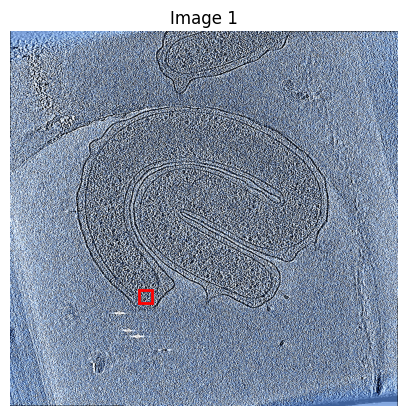

Image 1:
  Label: motor, Box: [476.0, 170.0, 508.0, 202.0]


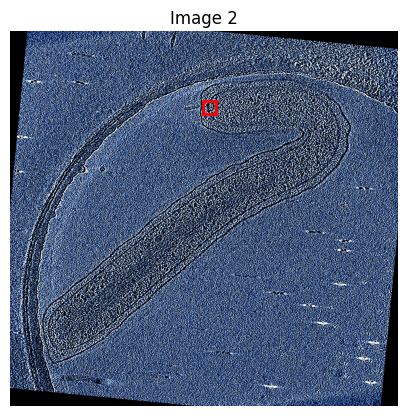

Image 2:
  Label: motor, Box: [611.0, 504.0, 643.0, 536.0]


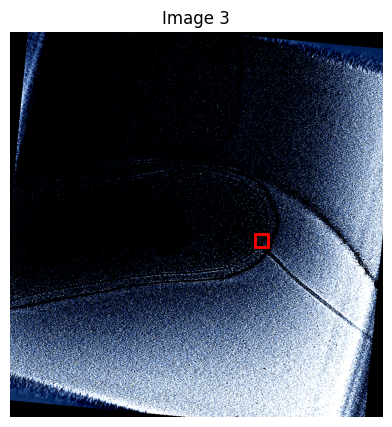

Image 3:
  No labels


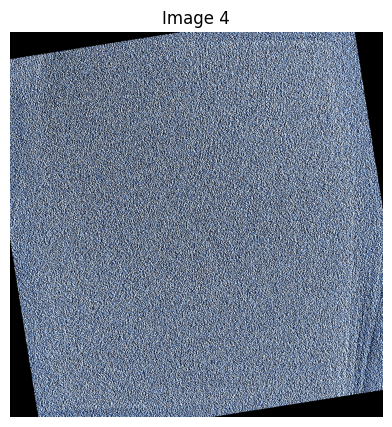

In [19]:

def show_batch_from_loader(data_loader, n=4, class_names=None):
    """
    Visualize n images from a DataLoader, with all transforms applied.
    Displays bounding boxes and prints labels for each image.
    Args:
        data_loader: PyTorch DataLoader.
        n: Number of images from the batch to visualize.
        class_names: Optional list of class names (e.g. ["background", "motor"]).
    """
    images, targets = next(iter(data_loader))

    for i in range(min(n, len(images))):
        img = images[i]
        target = targets[i]

        img_np = img.permute(1, 2, 0).cpu().numpy()
        plt.figure(figsize=(5,5))
        plt.imshow(img_np)

        # Draw boxes if present, and print labels
        boxes = target["boxes"]
        labels = target["labels"]
        print(f"Image {i}:")
        if len(labels) == 0:
            print("  No labels")
        else:
            for box, label in zip(boxes, labels):
                xmin, ymin, xmax, ymax = box
                plt.gca().add_patch(
                    plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                  fill=False, edgecolor='red', linewidth=2)
                )
                # Print label (optionally decode numeric class to string)
                if class_names is not None and label.item() < len(class_names):
                    label_str = class_names[label.item()]
                else:
                    label_str = str(label.item())
                print(f"  Label: {label_str}, Box: [{xmin:.1f}, {ymin:.1f}, {xmax:.1f}, {ymax:.1f}]")
        plt.axis('off')
        plt.title(f"Image {i+1}")
        plt.show()

# Example usage, assuming 2 classes: 0 = background, 1 = motor
show_batch_from_loader(train_data_loader, n=5, class_names=["background", "motor"])


### Define the Model

In [25]:
# Load a pre-trained Faster R-CNN
model = fasterrcnn_resnet50_fpn(pretrained=True)

# Replace the classification head
num_classes = 2  # 1 motor class + 1 background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Put model on GPU
model.to(device)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

## Load old model

In [ ]:
from re import M
def load_fasterrcnn_model(model_path, device, num_classes=2, backbone='resnet50'):
    """
    Loads a Faster R-CNN model with custom number of classes and state_dict from file.

    Args:
        model_path (str): Path to the saved .pth file.
        device (torch.device): 'cuda' or 'cpu'.
        num_classes (int): Number of output classes (including background).
        backbone (str): Backbone architecture ('resnet50', etc.).

    Returns:
        model: PyTorch Faster R-CNN model, loaded and ready.
    """
    # Build model architecture
    if backbone == 'resnet50':
        model = fasterrcnn_resnet50_fpn(weights=None, weights_backbone=None)
    # (Add more options for other backbones if needed)

    # Replace the classifier head for your number of classes
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Load weights
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)

    # Move to device and set eval mode
    model.to(device)
    model.eval()
    print(f"Loaded model from {model_path} onto {device}")
    return model

# Example usage:
MODEL_PATH = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/SavedModels/fasterrcnn_motor_detector_5.pth"
load_model = False

if load_model:
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = load_fasterrcnn_model(MODEL_PATH, device, num_classes=2)


## Check distribution of batch for data

In [21]:
images, targets = next(iter(train_data_loader))
print("Train targets example:", targets)
images, targets = next(iter(validation_data_loader))
print("Validation targets example:", targets)


Train targets example: ({'boxes': tensor([[625., 510., 657., 542.]]), 'labels': tensor([1]), 'image_id': tensor([152]), 'area': tensor([1024.]), 'iscrowd': tensor([0])}, {'boxes': tensor([], size=(0, 4)), 'labels': tensor([], dtype=torch.int64), 'image_id': tensor([486]), 'area': tensor([]), 'iscrowd': tensor([], dtype=torch.int64)}, {'boxes': tensor([], size=(0, 4)), 'labels': tensor([], dtype=torch.int64), 'image_id': tensor([294]), 'area': tensor([]), 'iscrowd': tensor([], dtype=torch.int64)}, {'boxes': tensor([[411., 733., 443., 765.]]), 'labels': tensor([1]), 'image_id': tensor([366]), 'area': tensor([1024.]), 'iscrowd': tensor([0])})
Validation targets example: ({'boxes': tensor([[436., 548., 468., 580.]]), 'labels': tensor([1]), 'image_id': tensor([655]), 'area': tensor([1024.]), 'iscrowd': tensor([0])}, {'boxes': tensor([[364., 223., 396., 255.]]), 'labels': tensor([1]), 'image_id': tensor([590]), 'area': tensor([1024.]), 'iscrowd': tensor([0])}, {'boxes': tensor([], size=(0, 4

## Training / Validation Loop

In [29]:
# Define hyperparameters

num_epochs = 15
lr = 0.008
score_threshold = 0.3
scheduler_step = 5,
scheduler_gamma = 0.5,

#===== Helper Function to Compute Validation Accuuracy =====

def compute_iou(boxA, boxB):
    """
    Compute the Intersection-over-Union (IoU) between two bounding boxes.

    Args:
        boxA (array-like): [x1, y1, x2, y2]
        boxB (array-like): [x1, y1, x2, y2]

    Returns:
        float: IoU value
    """
    # Determine the coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Compute the area of intersection
    interArea = max(0, xB - xA) * max(0, yB - yA)
    if interArea == 0:
        return 0.0

    # Compute the area of both boxes
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Compute the intersection over union
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou


def compute_f2_score(pred_boxes, gt_boxes, iou_threshold=0.5):
    """
    Compute F2 score for a single image, given predicted and ground-truth boxes.

    Args:
        pred_boxes (np.ndarray): Array of predicted boxes [N_pred, 4]
        gt_boxes (np.ndarray): Array of ground truth boxes [N_gt, 4]
        iou_threshold (float): IoU threshold to consider a detection a true positive

    Returns:
        float: F2 score for this image
    """
    matched_gt = set()
    tp = 0  # True positives

    # Match predicted boxes to ground-truth boxes
    for pred_box in pred_boxes:
        for i, gt_box in enumerate(gt_boxes):
            if i in matched_gt:
                continue  # Skip already matched gt boxes
            if compute_iou(pred_box, gt_box) >= iou_threshold:
                tp += 1
                matched_gt.add(i)
                break  # Move to next predicted box

    fp = len(pred_boxes) - tp  # False positives
    fn = len(gt_boxes) - tp    # False negatives

    beta2 = 4  # beta^2 for F2 score (beta=2)

    # Calculate precision and recall, avoid division by zero
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    if precision + recall == 0:
        return 0.0

    # F2 score formula
    f2 = (1 + beta2) * (precision * recall) / (beta2 * precision + recall)
    return f2


def train_and_validate_detector(
    model,
    train_data_loader,
    validation_data_loader,
    device,
    compute_f2_score,  # pass your F2 function
    num_epochs=10,
    lr=0.005,
    score_threshold=0.5,
    scheduler_step = 3,
    scheduler_gamma = 0.5,
    train_losses=None,
    val_f2s_all=None,
):
    """
    Train and validate a PyTorch object detector with F2 evaluation.

    Args:
        model: PyTorch detection model (e.g., Faster R-CNN)
        train_data_loader: Dataloader for training set
        validation_data_loader: Dataloader for validation set
        device: 'cuda' or 'cpu'
        compute_f2_score: Function to compute F2 (pred_boxes, gt_boxes)
        num_epochs: Number of training epochs
        lr: Learning rate
        score_threshold: Minimum score to keep predicted boxes
        train_losses (list): List to store training losses
        val_f2s_all (list): List to store validation F2 scores
    """

    # ==== Identify Tracked Values ====
    train_losses = []
    val_f2s_all = []

    # Set up optimizer and scheduler
    optimizer = torch.optim.SGD(
        model.parameters(), lr=lr, momentum=0.9, weight_decay=0.0005
    )
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

    for epoch in range(num_epochs):
        # --- Training phase ---
        model.train()
        total_loss = 0.0
        pbar = tqdm(train_data_loader, desc=f"Epoch {epoch + 1}/{num_epochs}", leave=False)

        for images, targets in pbar:
            # Move images and targets to the selected device
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Forward pass, compute loss
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            # Backpropagation
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()

            total_loss += losses.item()

        # Average training loss for this epoch
        avg_train_loss = total_loss / len(train_data_loader)
        train_losses.append(avg_train_loss)
        print(f"[Epoch {epoch + 1}/{num_epochs}] Loss: {avg_train_loss:.4f}")

        # Step the learning rate scheduler
        scheduler.step()

        # --- Validation phase ---
        model.eval()
        val_f2s = []
        with torch.no_grad():
            for images, targets in tqdm(validation_data_loader, desc="Validation", leave=False):
                images = [img.to(device) for img in images]
                gt_boxes_batch = [t["boxes"].cpu().numpy() for t in targets]  # Get GT boxes as numpy arrays
                outputs = model(images)  # Get model predictions

                for pred, gt_boxes in zip(outputs, gt_boxes_batch):
                    pred_boxes = pred["boxes"].cpu().numpy()
                    # Only keep predictions with score above threshold
                    if "scores" in pred:
                        keep = pred["scores"].cpu().numpy() > score_threshold
                        pred_boxes = pred_boxes[keep]
                    # Compute F2 score for this sample
                    f2 = compute_f2_score(pred_boxes, gt_boxes)
                    val_f2s.append(f2)

        # Average F2 score for this validation epoch
        avg_f2 = sum(val_f2s) / len(val_f2s) if val_f2s else 0.0
        val_f2s_all.append(avg_f2)
        print(f"[Epoch {epoch + 1}/{num_epochs}] Validation F2: {avg_f2:.4f}")

    return train_losses, val_f2s_all

# --------- Usage ---------

train_losses, val_f2s_all = train_and_validate_detector(
     model, train_data_loader, validation_data_loader, device, compute_f2_score,
     num_epochs=num_epochs, lr=lr, score_threshold=score_threshold, scheduler_step=scheduler_step,
     scheduler_gamma=scheduler_gamma
)

[Epoch 1/15] Loss: 0.0845


[Epoch 1/15] Validation F2: 0.0000


[Epoch 2/15] Loss: 0.0511


[Epoch 2/15] Validation F2: 0.0424


[Epoch 3/15] Loss: 0.0526


[Epoch 3/15] Validation F2: 0.0465


[Epoch 4/15] Loss: 0.0496


[Epoch 4/15] Validation F2: 0.0577


[Epoch 5/15] Loss: 0.0494


[Epoch 5/15] Validation F2: 0.0778


[Epoch 6/15] Loss: 0.0498


[Epoch 6/15] Validation F2: 0.0651


[Epoch 7/15] Loss: 0.0491


[Epoch 7/15] Validation F2: 0.0822


[Epoch 8/15] Loss: 0.0484


[Epoch 8/15] Validation F2: 0.0777


[Epoch 9/15] Loss: 0.0479


[Epoch 9/15] Validation F2: 0.0692


[Epoch 10/15] Loss: 0.0476


[Epoch 10/15] Validation F2: 0.0842


[Epoch 11/15] Loss: 0.0477


[Epoch 11/15] Validation F2: 0.0848


[Epoch 12/15] Loss: 0.0478


[Epoch 12/15] Validation F2: 0.0857


[Epoch 13/15] Loss: 0.0467


[Epoch 13/15] Validation F2: 0.0953


[Epoch 14/15] Loss: 0.0474


[Epoch 14/15] Validation F2: 0.0764


[Epoch 15/15] Loss: 0.0483


[Epoch 15/15] Validation F2: 0.0794


## Hyper parameter grid search

In [13]:
def hyperparameter_search(
    model_fn,
    train_dataset, val_dataset,
    device,
    learning_rates=[1e-3, 5e-4, 1e-4],
    score_thresholds=[0.3, 0.5, 0.7],
    batch_size=4,
    num_epochs=5
):
    best_f2 = 0
    best_params = {}
    for lr in learning_rates:
        for threshold in score_thresholds:
            print(f"\nTrying lr={lr}, score_threshold={threshold}")
            # Reset model (use a fresh instance each time)
            model = model_fn()
            train_loader = DataLoader(
                train_dataset, batch_size=batch_size, shuffle=True,
                collate_fn=lambda x: tuple(zip(*x)))
            val_loader = DataLoader(
                val_dataset, batch_size=batch_size, shuffle=False,
                collate_fn=lambda x: tuple(zip(*x)))
            train_losses, val_f2s_all = train_and_validate_detector(
                model, train_loader, val_loader, device, compute_f2_score,
                num_epochs=num_epochs, lr=lr, score_threshold=threshold
            )
            print(f"Final Validation F2: {val_f2s_all[-1]:.4f}")
            if val_f2s_all[-1] > best_f2:
                best_f2 = val_f2s_all[-1]
                best_params = {"lr": lr, "score_threshold": threshold}
    print("\nBest hyperparameters:", best_params, "Best F2:", best_f2)
    return best_params

# Turn of and on hp grid search
hp_grid_search = False

if hp_grid_search:

  # --- Model constructor ---
  def model_fn():
      import torchvision
      # You can change the number of classes as needed (background + motor)
      num_classes = 2
      model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
      in_features = model.roi_heads.box_predictor.cls_score.in_features
      model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)
      return model.to(device)

  # --- Hyperparameter search ---
  best_params = hyperparameter_search(
      model_fn, train_dataset, val_dataset, device,
      learning_rates=[0.005, 0.001, 0.0005],
      score_thresholds=[0.3, 0.5, 0.7],
      batch_size=4,
      num_epochs=5
  )


Trying lr=0.005, score_threshold=0.3


[Epoch 1/5] Loss: 0.0984


[Epoch 1/5] Validation F2: 0.0566


[Epoch 2/5] Loss: 0.0638


[Epoch 2/5] Validation F2: 0.1029


[Epoch 3/5] Loss: 0.0557


[Epoch 3/5] Validation F2: 0.2138


[Epoch 4/5] Loss: 0.0518


[Epoch 4/5] Validation F2: 0.1850


[Epoch 5/5] Loss: 0.0497


[Epoch 5/5] Validation F2: 0.2730
Final Validation F2: 0.2730

Trying lr=0.005, score_threshold=0.5


[Epoch 1/5] Loss: nan


[Epoch 1/5] Validation F2: 0.0000


[Epoch 2/5] Loss: nan


[Epoch 2/5] Validation F2: 0.0000


[Epoch 3/5] Loss: nan


[Epoch 3/5] Validation F2: 0.0000


[Epoch 4/5] Loss: nan


[Epoch 4/5] Validation F2: 0.0000


[Epoch 5/5] Loss: nan


[Epoch 5/5] Validation F2: 0.0000
Final Validation F2: 0.0000

Trying lr=0.005, score_threshold=0.7


[Epoch 1/5] Loss: 0.1225


[Epoch 1/5] Validation F2: 0.0000


[Epoch 2/5] Loss: 0.0558


[Epoch 2/5] Validation F2: 0.0000


[Epoch 3/5] Loss: 0.0703


[Epoch 3/5] Validation F2: 0.0000


[Epoch 4/5] Loss: 0.0805


[Epoch 4/5] Validation F2: 0.0000


[Epoch 5/5] Loss: 0.0826


[Epoch 5/5] Validation F2: 0.1244
Final Validation F2: 0.1244

Trying lr=0.001, score_threshold=0.3


[Epoch 1/5] Loss: 0.1113


[Epoch 1/5] Validation F2: 0.0000


[Epoch 2/5] Loss: 0.0588


[Epoch 2/5] Validation F2: 0.0068


[Epoch 3/5] Loss: 0.0544


[Epoch 3/5] Validation F2: 0.0879


[Epoch 4/5] Loss: 0.0515


[Epoch 4/5] Validation F2: 0.1254


[Epoch 5/5] Loss: 0.0477


[Epoch 5/5] Validation F2: 0.1655
Final Validation F2: 0.1655

Trying lr=0.001, score_threshold=0.5


[Epoch 1/5] Loss: 0.1163


[Epoch 1/5] Validation F2: 0.0000


[Epoch 2/5] Loss: 0.0576


[Epoch 2/5] Validation F2: 0.0000


[Epoch 3/5] Loss: 0.0529


[Epoch 3/5] Validation F2: 0.0000


[Epoch 4/5] Loss: 0.0512


[Epoch 4/5] Validation F2: 0.0068


[Epoch 5/5] Loss: 0.0466


[Epoch 5/5] Validation F2: 0.0708
Final Validation F2: 0.0708

Trying lr=0.001, score_threshold=0.7


[Epoch 1/5] Loss: 0.0814


[Epoch 1/5] Validation F2: 0.0000


[Epoch 2/5] Loss: 0.0652


[Epoch 2/5] Validation F2: 0.0000


[Epoch 3/5] Loss: 0.0629


[Epoch 3/5] Validation F2: 0.0000


[Epoch 4/5] Loss: 0.0623


[Epoch 4/5] Validation F2: 0.0000


[Epoch 5/5] Loss: 0.0650


[Epoch 5/5] Validation F2: 0.0000
Final Validation F2: 0.0000

Trying lr=0.0005, score_threshold=0.3


[Epoch 1/5] Loss: 0.1002


[Epoch 1/5] Validation F2: 0.0000


[Epoch 2/5] Loss: 0.0662


[Epoch 2/5] Validation F2: 0.0000


[Epoch 3/5] Loss: 0.0624


[Epoch 3/5] Validation F2: 0.0000


[Epoch 4/5] Loss: 0.0598


[Epoch 4/5] Validation F2: 0.0299


[Epoch 5/5] Loss: 0.0565


[Epoch 5/5] Validation F2: 0.0987
Final Validation F2: 0.0987

Trying lr=0.0005, score_threshold=0.5


[Epoch 1/5] Loss: 0.1011


[Epoch 1/5] Validation F2: 0.0000


[Epoch 2/5] Loss: 0.0633


[Epoch 2/5] Validation F2: 0.0000


[Epoch 3/5] Loss: 0.0600


[Epoch 3/5] Validation F2: 0.0000


[Epoch 4/5] Loss: 0.0592


[Epoch 4/5] Validation F2: 0.0000


[Epoch 5/5] Loss: 0.0569


[Epoch 5/5] Validation F2: 0.0000
Final Validation F2: 0.0000

Trying lr=0.0005, score_threshold=0.7


[Epoch 1/5] Loss: 0.0935


[Epoch 1/5] Validation F2: 0.0000


[Epoch 2/5] Loss: 0.0708


[Epoch 2/5] Validation F2: 0.0000


[Epoch 3/5] Loss: 0.0681


[Epoch 3/5] Validation F2: 0.0000


[Epoch 4/5] Loss: 0.0648


[Epoch 4/5] Validation F2: 0.0000


[Epoch 5/5] Loss: 0.0620


[Epoch 5/5] Validation F2: 0.0000
Final Validation F2: 0.0000

Best hyperparameters: {'lr': 0.005, 'score_threshold': 0.3} Best F2: 0.27301711492887976


## Export Model


In [42]:
def export_model_and_metrics(
    model,
    folder,
    train_losses=None,
    val_metrics=None,
    num_epochs=None,
    lr=None,
    score_threshold=None,
    scheduler_step=None,
    scheduler_gamma=None,
    extra_hparams=None  # for extensibility!
):
    """
    Exports model weights and metrics (including hyperparameters) to a specified folder.
    Model saved as 'model.pth', metrics/hyperparams as 'metrics.json'.

    Args:
        model: PyTorch model instance.
        folder (str): Output directory.
        train_losses (list, optional): Training losses.
        val_metrics (list, optional): Validation metrics (e.g. F2).
        num_epochs (int, optional): Number of epochs.
        lr (float, optional): Learning rate.
        score_threshold (float, optional): Detection score threshold.
        scheduler_step (int, optional): LR scheduler step size.
        scheduler_gamma (float, optional): LR scheduler gamma.
        extra_hparams (dict, optional): Any other hyperparameters.
    """
    os.makedirs(folder, exist_ok=True)

    # Save model
    model_path = os.path.join(folder, "model.pth")
    model_cpu = model.to('cpu')
    torch.save(model_cpu.state_dict(), model_path)

    # Prepare metrics/hyperparameters dict
    metrics = {
        "train_losses": train_losses,
        "val_metrics": val_metrics,
        "num_epochs": num_epochs,
        "learning_rate": lr,
        "score_threshold": score_threshold,
        "scheduler_step": scheduler_step,
        "scheduler_gamma": scheduler_gamma,
    }
    # Add any other hyperparameters if provided
    if extra_hparams is not None:
        metrics.update(extra_hparams)

    # Save metrics as JSON
    metrics_path = os.path.join(folder, "metrics.json")
    with open(metrics_path, "w") as f:
        json.dump(metrics, f, indent=4)

    print(f"Model exported to {model_path}")
    print(f"Metrics & hyperparameters exported to {metrics_path}")

# ---- Example usage ----
folder = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/SavedModels/exp_6"

export = False

if export == True:
  export_model_and_metrics(
      model, folder,
      train_losses=train_losses,
      val_metrics=val_f2s_all,
      num_epochs=15,
      lr=0.005,
      score_threshold=0.3,
      scheduler_step=3,
      scheduler_gamma=0.3,
      extra_hparams={
          "batch_size": batch_size,
          "backbone": "fasterrcnn_resnet50_fpn"
      }
  )
else:
  print("Model not exported")

## Visualize & Evaluate Model

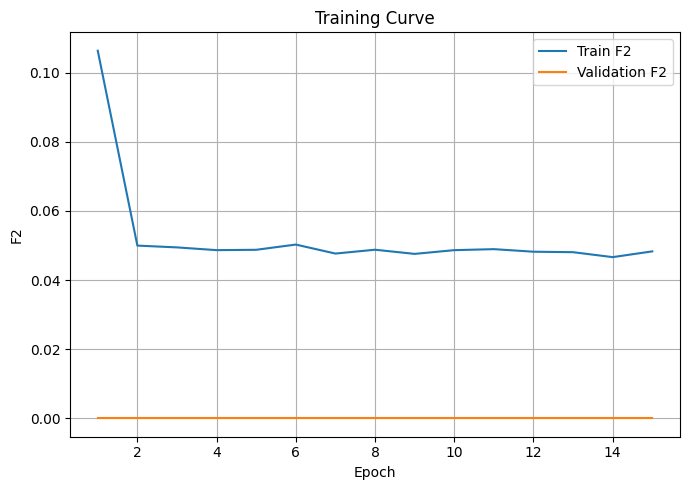

In [23]:
def plot_loss_and_f2(train_losses, val_f2s):
    # X-axis values: epoch numbers, starting at 1
    epochs = range(1, len(train_losses) + 1)

    # Create a new figure and primary axis (for loss)
    fig, ax1 = plt.subplots(figsize=(7, 5))

    # Plot training loss (primary y-axis, left)
    color = 'tab:blue'
    ax1.set_xlabel('Epoch', fontsize=18)  # X-axis label
    ax1.set_ylabel('Train Loss', color=color, fontsize=18)  # Y-axis label for loss
    ax1.plot(epochs, train_losses, color=color, label="Train Loss")  # Plot line
    ax1.tick_params(axis='y', labelcolor=color, labelsize=14)  # Tick color and size for y-axis (loss)
    ax1.tick_params(axis='x', labelsize=14)  # Tick size for x-axis (epochs)
    ax1.grid(True)  # Add gridlines for readability

    # Create a secondary y-axis for validation F2 score (on the right)
    ax2 = ax1.twinx()
    color = 'tab:brown'
    ax2.set_ylabel('Validation F2', color=color, fontsize=18)  # Y-axis label for F2
    ax2.plot(epochs, val_f2s, color=color, label="Validation F2")  # Plot validation F2
    ax2.tick_params(axis='y', labelcolor=color, labelsize=14)  # Tick color and size for y-axis (F2)

    # Add a title to the figure
    plt.title("Training Loss and Validation F2 Curve", fontsize=24)

    # Adjust layout to prevent label overlap/cutoff
    fig.tight_layout()

    # Display the plot
    plt.show()

# Example usage:
plot_loss_and_f2(train_losses, val_f2s_all)


## Check Model Outputs

Predictions for first image: {'boxes': tensor([], size=(0, 4)), 'labels': tensor([], dtype=torch.int64), 'scores': tensor([])}
Ground truth for first image: {'boxes': tensor([[436., 548., 468., 580.]]), 'labels': tensor([1])}


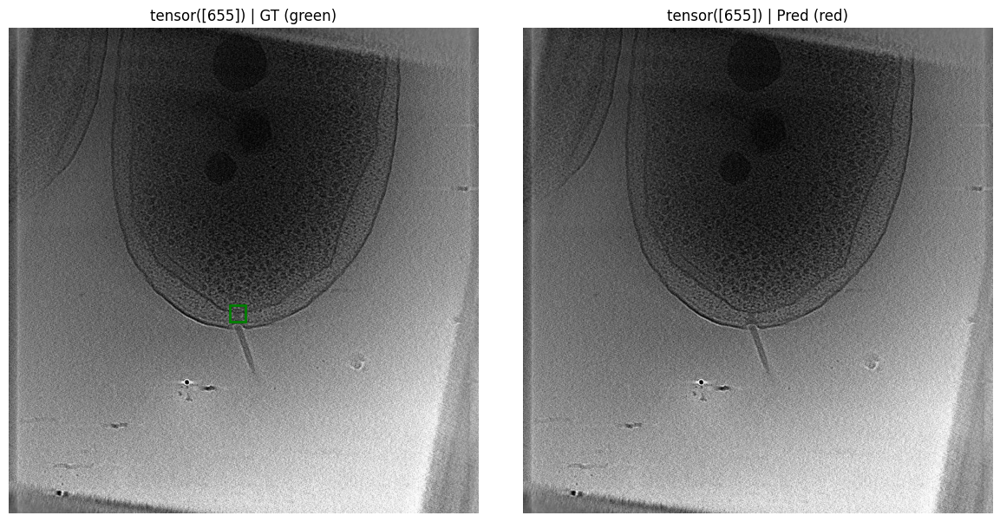

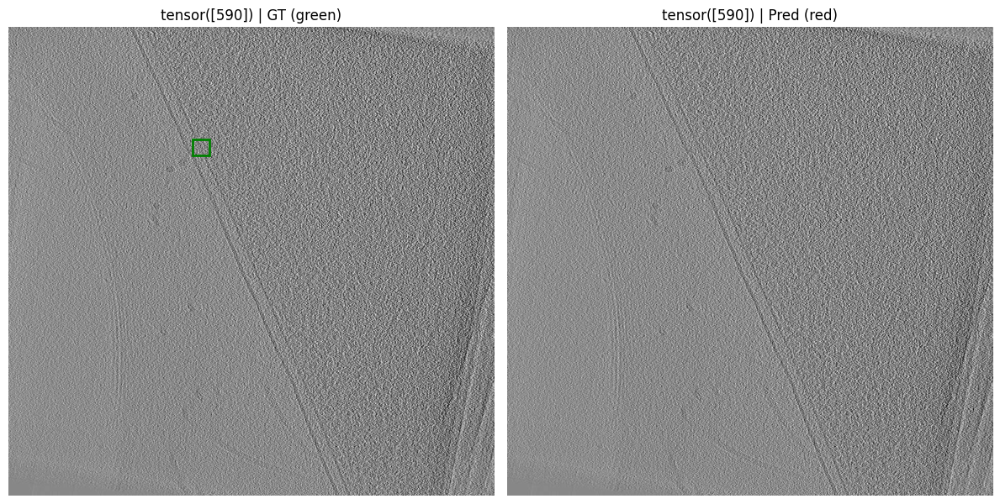

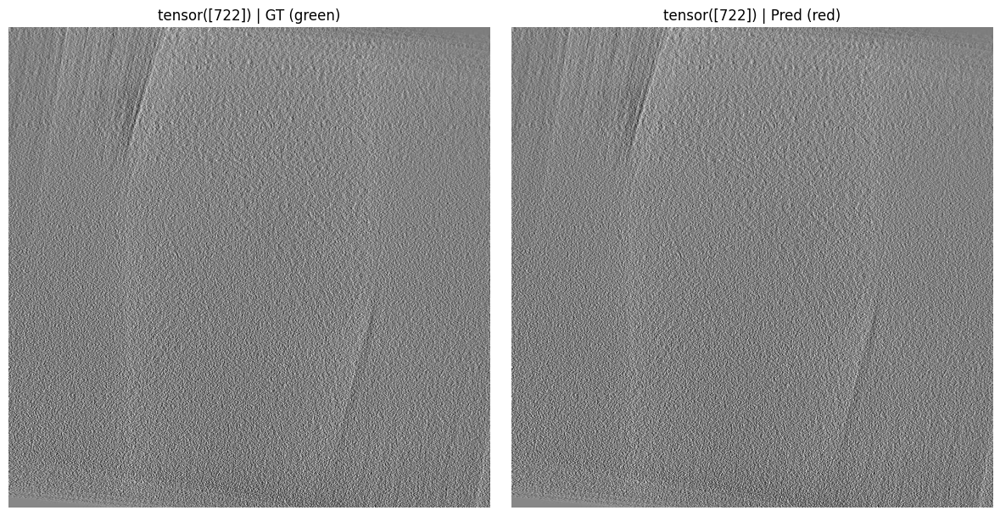

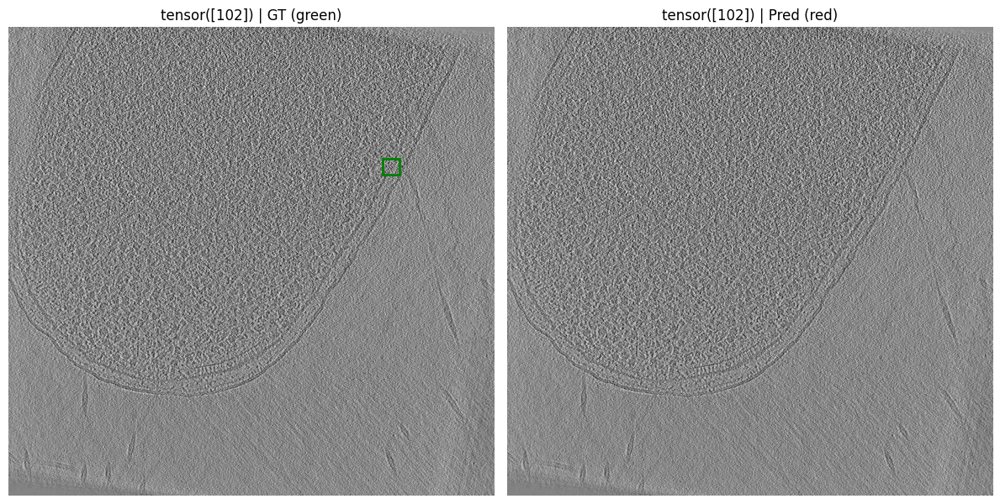

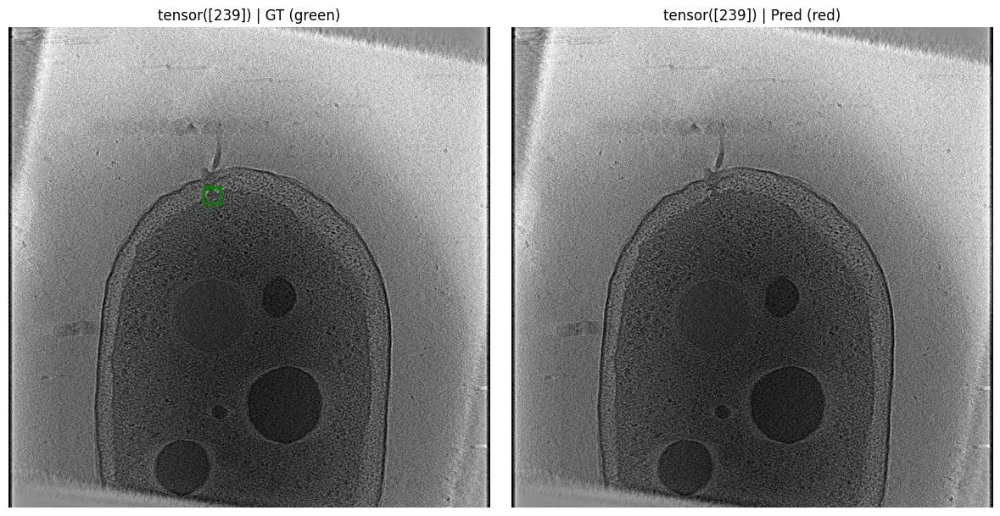

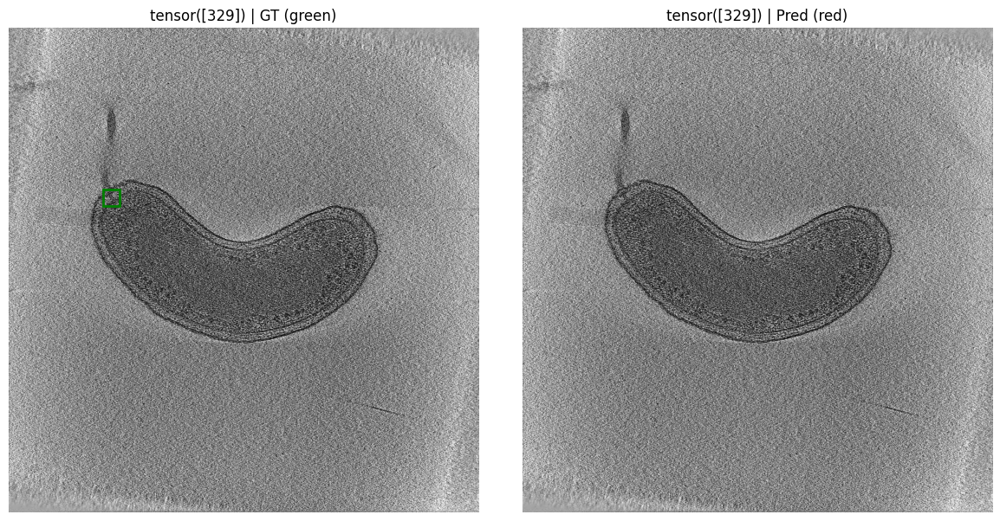

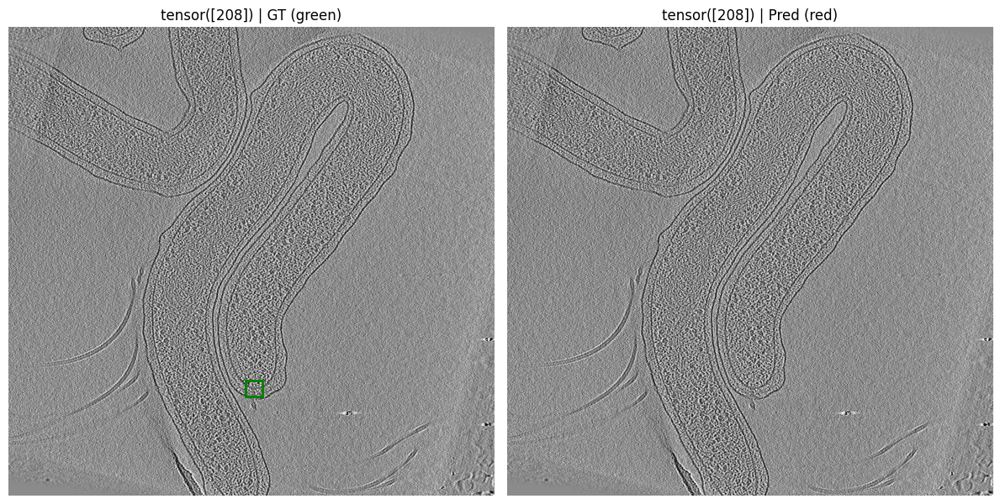

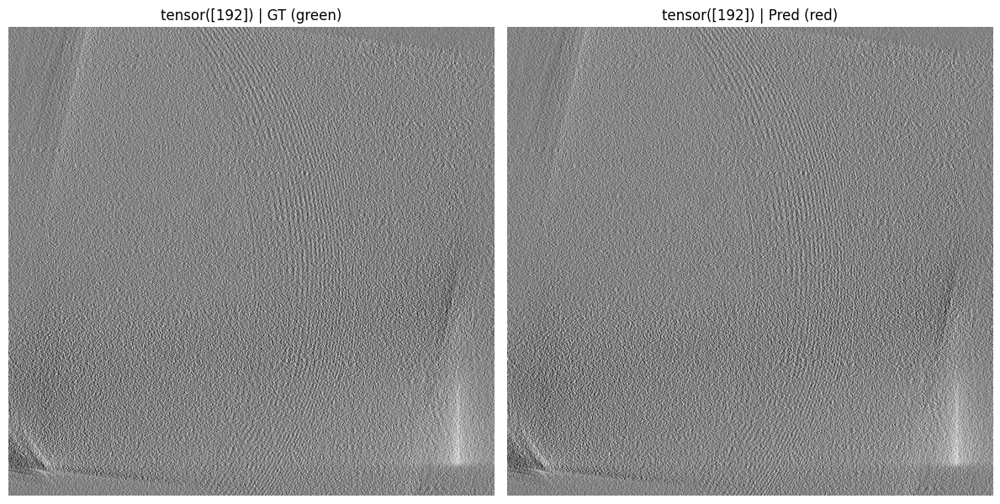

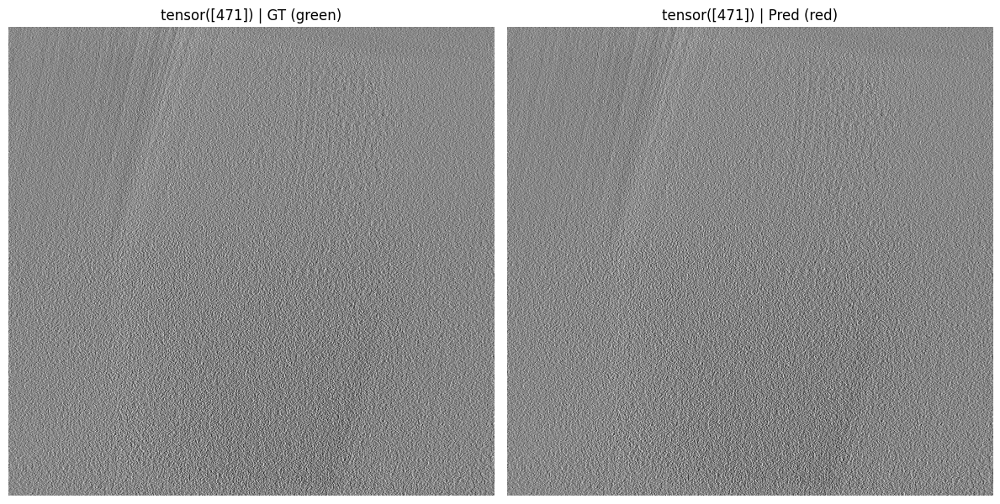

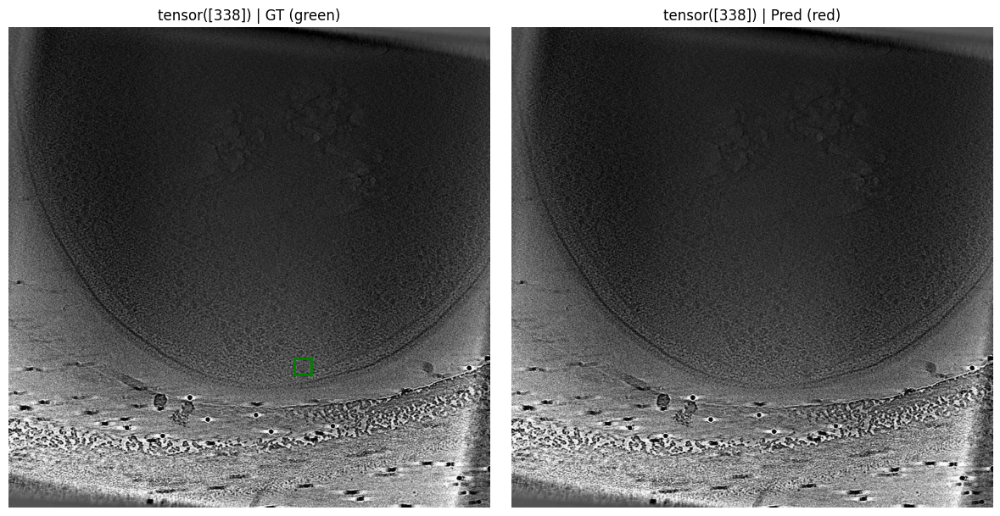

In [24]:
def get_model_outputs(model, data_loader, device, score_threshold=0.05):
    """
    Runs the model on all images in data_loader and applies score threshold.

    Returns:
        all_outputs: List of dicts with filtered 'boxes', 'labels', 'scores' per image.
        all_targets: List of GT target dicts per image.
    """
    model.eval()  # Set model to evaluation mode
    all_outputs = []  # Stores predictions for each image
    all_targets = []  # Stores ground truth for each image

    with torch.no_grad():  # No gradients needed for inference
        for images, targets in data_loader:
            images = [img.to(device) for img in images]  # Move images to device (CPU or GPU)
            outputs = model(images)
            # outputs: List of dicts, one per image

            # Loop through outputs for each image in the batch
            for out in outputs:
                # Filter predictions by confidence score threshold
                if 'scores' in out and len(out['scores']) > 0:
                    keep = out['scores'] >= score_threshold
                    boxes = out['boxes'][keep].cpu()
                    labels = out['labels'][keep].cpu()
                    scores = out['scores'][keep].cpu()
                else:
                    # If there are no predictions for this image
                    boxes = torch.zeros((0, 4))
                    labels = torch.zeros((0,), dtype=torch.int64)
                    scores = torch.zeros((0,))
                all_outputs.append({
                    'boxes': boxes,
                    'labels': labels,
                    'scores': scores,
                })

            # Move targets to CPU for easy comparison
            for t in targets:
                gt_boxes = t['boxes'].cpu()
                gt_labels = t['labels'].cpu()
                all_targets.append({
                    'boxes': gt_boxes,
                    'labels': gt_labels,
                })

    return all_outputs, all_targets

# Example usage:
all_outputs, all_targets = get_model_outputs(
    model, validation_data_loader, device, score_threshold=0.01
)

# Now you can use all_outputs and all_targets for F2, visualization, etc.
print(f"Predictions for first image: {all_outputs[0]}")
print(f"Ground truth for first image: {all_targets[0]}")

mean = 0.4831
std = 0.2189

def unnormalize(img, mean, std):
    """
    Unnormalize a torch tensor image for display (handles 1 or 3 channels).
    """
    img = img.clone()
    if img.shape[0] == 1:  # Grayscale
        img = img * std + mean
        img = img[0].cpu().numpy()
    else:  # RGB
        for c in range(3):
            img[c] = img[c] * std + mean
        img = img.permute(1, 2, 0).cpu().numpy()
    img = np.clip(img, 0, 1)
    return img

# Visualize the first 10 samples from the validation dataset
for i in range(10):
    img, target = val_dataset[i]                # Load image and target from dataset
    img_disp = unnormalize(img, mean, std)      # Unnormalize image for display
    preds = all_outputs[i]                      # Predicted boxes/labels/scores
    gts = all_targets[i]                        # Ground truth boxes/labels
    label = target.get('image_id', f"Slice {i}")  # Image ID or index

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    # --- Left: Ground truth ---
    ax = axes[0]
    if img_disp.ndim == 2:
        ax.imshow(img_disp, cmap='gray')
    else:
        ax.imshow(img_disp)
    # Plot ground truth boxes in green
    for box in gts['boxes']:
        ax.add_patch(patches.Rectangle(
            (box[0], box[1]), box[2]-box[0], box[3]-box[1],
            linewidth=2, edgecolor='g', facecolor='none'
        ))
    ax.set_title(f"{label} | GT (green)")
    ax.axis("off")

    # --- Right: Predictions ---
    ax = axes[1]
    if img_disp.ndim == 2:
        ax.imshow(img_disp, cmap='gray')
    else:
        ax.imshow(img_disp)
    # Plot predicted boxes in red
    for box in preds['boxes']:
        ax.add_patch(patches.Rectangle(
            (box[0], box[1]), box[2]-box[0], box[3]-box[1],
            linewidth=2, edgecolor='r', facecolor='none'
        ))
    ax.set_title(f"{label} | Pred (red)")
    ax.axis("off")

    plt.tight_layout()
    plt.show()



## Run Inference on a Single Motor

In [ ]:
import os
import torch
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

def infer_motor_location(model, tomo_dir, device='cpu', score_threshold=0.5, show=True):
    """
    Infers the most likely motor location from a 3D tomogram and optionally visualizes it.

    Args:
        model (torch.nn.Module): Trained Faster R-CNN model.
        tomo_dir (str): Path to folder containing slice_XXXX.jpg images.
        device (str): 'cuda' or 'cpu'.
        score_threshold (float): Minimum score to accept a detection.
        show (bool): Whether to visualize the top detection.

    Returns:
        dict: Detection info or a message if none found.
    """
    model.to(device)
    model.eval()

    transform = transforms.ToTensor()
    best_detection = None
    best_image = None

    for slice_file in sorted(os.listdir(tomo_dir)):
        if not slice_file.endswith(".jpg"):
            continue

        try:
            z_index = int(slice_file.split("_")[1].split(".")[0])
        except Exception:
            continue

        img_path = os.path.join(tomo_dir, slice_file)
        image = Image.open(img_path).convert("L")
        img_tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            outputs = model(img_tensor)[0]

        for box, score in zip(outputs["boxes"], outputs["scores"]):
            if score >= score_threshold:
                xmin, ymin, xmax, ymax = box.tolist()
                x_center = (xmin + xmax) / 2
                y_center = (ymin + ymax) / 2

                detection = {
                    "slice": slice_file,
                    "Motor axis 0": z_index,
                    "Motor axis 1": y_center,
                    "Motor axis 2": x_center,
                    "score": float(score),
                    "bbox": [xmin, ymin, xmax, ymax]
                }

                if best_detection is None or score > best_detection["score"]:
                    best_detection = detection
                    best_image = image.copy()

    if best_detection and show:
        fig, ax = plt.subplots(figsize=(6, 6))
        ax.imshow(best_image)
        xmin, ymin, xmax, ymax = best_detection["bbox"]
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   edgecolor='red', linewidth=2, fill=False))
        ax.scatter(best_detection["Motor axis 2"], best_detection["Motor axis 1"], color='red', s=60)
        ax.set_title(f"Best Detection\nz={best_detection['Motor axis 0']} | score={best_detection['score']:.2f}")
        plt.axis("off")
        plt.show()

    return best_detection if best_detection else {"message": "No confident detections found."}


# Test
test_1 = TEST_DIR + "/tomo_00e047"
test_1_inference = infer_motor_location(model, test_1, device=device)

test_2 = TEST_DIR + "/tomo_01a877"
test_2_inference = infer_motor_location(model, test_2, device=device)

test_3 = TEST_DIR + "/tomo_003acc"
test_3_inference = infer_motor_location(model, test_3, device=device)



## Run Inference on Multiple Motors


In [ ]:
import os
import torch
import numpy as np
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

def infer_motor_locations_mult(
    model,
    tomo_dir,
    voxel_spacing=1,
    device='cpu',
    score_threshold=0.5,
    min_dist=10,
    show=True
):
    """
    Infers the most likely motor locations (distinct) from a 3D tomogram.

    Args:
        model (torch.nn.Module): Trained Faster R-CNN model.
        tomo_dir (str): Path to folder containing slice_XXXX.jpg images.
        device (str): 'cuda' or 'cpu'.
        score_threshold (float): Minimum score to accept a detection.
        min_dist (float): Minimum distance between detected motors.
        show (bool): Whether to visualize the detections.

    Returns:
        list[dict]: List of confident, spatially-distinct detections.
    """
    model.to(device)
    model.eval()

    transform = transforms.ToTensor()
    detections = []

    # Collect all confident detections from all slices
    for slice_file in sorted(os.listdir(tomo_dir)):
        if not slice_file.endswith(".jpg"):
            continue
        try:
            z_index = int(slice_file.split("_")[1].split(".")[0])
        except Exception:
            continue

        img_path = os.path.join(tomo_dir, slice_file)
        image = Image.open(img_path).convert("RGB")
        img_tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            outputs = model(img_tensor)[0]

        for box, score in zip(outputs["boxes"], outputs["scores"]):
            if score >= score_threshold:
                xmin, ymin, xmax, ymax = box.tolist()
                x_center = (xmin + xmax) / 2
                y_center = (ymin + ymax) / 2

                detections.append({
                    "slice": slice_file,
                    "Motor axis 0": z_index,
                    "Motor axis 1": y_center,
                    "Motor axis 2": x_center,
                    "score": float(score),
                    "bbox": [xmin, ymin, xmax, ymax],
                    "image": image.copy()
                })

    if not detections:
        return [{"message": "No confident detections found."}]

    # Sort detections by score (desc)
    detections.sort(key=lambda d: d['score'], reverse=True)

    # Greedily select distinct locations (non-overlapping)
    unique_detections = []
    centers = []

    for det in detections:
        c = np.array([det['Motor axis 0'], det['Motor axis 1'], det['Motor axis 2']])
        if not centers or all(np.linalg.norm(c - other) >= min_dist for other in centers):
            unique_detections.append(det)
            centers.append(c)

    # Plot all unique detections if requested
    if show:
        for det in unique_detections:
            fig, ax = plt.subplots(figsize=(6, 6))
            ax.imshow(det["image"])
            xmin, ymin, xmax, ymax = det["bbox"]
            ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                       edgecolor='red', linewidth=2, fill=False))
            ax.scatter(det["Motor axis 2"], det["Motor axis 1"], color='red', s=60)
            ax.set_title(f"Detection\nz={det['Motor axis 0']} | score={det['score']:.2f}")
            plt.axis("off")
            plt.show()

    # Remove image data before returning
    for det in unique_detections:
        det.pop("image")

    return unique_detections


In [ ]:
# Entry with multiple motors
test_mult = TRAIN_DIR + "/tomo_00e463"
test_mult_inference = infer_motor_locations_mult(model, test_mult, device=device, min_dist=7, score_threshold=0.99, show=True)

In [ ]:
detections = test_mult_inference

for i, det in enumerate(detections):
    print(f"\nDetection {i+1}:")
    for key, value in det.items():
        print(f"  {key}: {value}")

## Put Test Inference Into a DF

In [ ]:
# Add folder names
test_1_inference["tomo_id"] = os.path.basename(test_1)
test_2_inference["tomo_id"] = os.path.basename(test_2)
test_3_inference["tomo_id"] = os.path.basename(test_3)

# Convert to DataFrame
inference_results = [test_1_inference, test_2_inference, test_3_inference]
submission_df = pd.DataFrame(inference_results)

# Display
print(submission_df)

## Put True Test Into a DF

In [ ]:
# Load your full CSV (e.g. ground truth or solution)
solution_df = pd.read_csv(LABELS_PATH)

# Filter rows where 'tomo_id' matches any in your inference df
solution_df = solution_df[solution_df['tomo_id'].isin(submission_df['tomo_id'])]

# Order rows by 'tomo_id'
solution_df = solution_df.set_index('tomo_id').loc[submission_df['tomo_id']].reset_index()

# Change column name Number of motors -> Has motor
solution_df = solution_df.rename(columns={"Number of motors": "Has motor"})


# View or save
print(solution_df)


## Prepare DFs to Evaluate

In [ ]:
import pandas as pd

def standardize_and_validate_columns(solution_df, submission_df):
    expected_solution_cols = [
        "tomo_id", "Motor axis 0", "Motor axis 1", "Motor axis 2", "Voxel spacing", "Has motor"
    ]
    expected_submission_cols = [
        "tomo_id", "Motor axis 0", "Motor axis 1", "Motor axis 2"
    ]

    # Filter to only the expected columns (if extras exist)
    solution_df = solution_df[expected_solution_cols].copy()
    submission_df = submission_df[expected_submission_cols].copy()

    # Validate that all required columns exist
    if not all(col in solution_df.columns for col in expected_solution_cols):
        raise ValueError("Missing required columns in solution DataFrame")

    if not all(col in submission_df.columns for col in expected_submission_cols):
        raise ValueError("Missing required columns in submission DataFrame")

    return solution_df, submission_df

solution_df, submission_df = standardize_and_validate_columns(solution_df, submission_df)

print(solution_df)
print(submission_df)


## BYU Evaluation Metric

In [ ]:
import sklearn.metrics
import numpy as np


class ParticipantVisibleError(Exception):
    # If you want an error message to be shown to participants, you must raise the error as a ParticipantVisibleError
    # All other errors will only be shown to the competition host. This helps prevent unintentional leakage of solution data.
    pass


def distance_metric(
    solution: pd.DataFrame,
    submission: pd.DataFrame,
    thresh_ratio: float,
    min_radius: float,
):
    coordinate_cols = ['Motor axis 0', 'Motor axis 1', 'Motor axis 2']
    label_tensor = solution[coordinate_cols].values.reshape(len(solution), -1, len(coordinate_cols))
    predicted_tensor = submission[coordinate_cols].values.reshape(len(submission), -1, len(coordinate_cols))
    # Find the minimum euclidean distances between the true and predicted points
    solution['distance'] = np.linalg.norm(label_tensor - predicted_tensor, axis=2).min(axis=1)
    # Convert thresholds from angstroms to voxels
    solution['thresholds'] = solution['Voxel spacing'].apply(lambda x: (min_radius * thresh_ratio) / x)
    solution['predictions'] = submission['Has motor'].values
    solution.loc[(solution['distance'] > solution['thresholds']) & (solution['Has motor'] == 1) & (submission['Has motor'] == 1), 'predictions'] = 0
    return solution['predictions'].values

def score(solution: pd.DataFrame, submission: pd.DataFrame, min_radius: float, beta: float) -> float:
    """
    Parameters:
    solution (pd.DataFrame): DataFrame containing ground truth motor positions.
    submission (pd.DataFrame): DataFrame containing predicted motor positions.

    Returns:
    float: FBeta score.

    Example
    --------
    >>> solution = pd.DataFrame({
    ...     'tomo_id': [0, 1, 2, 3],
    ...     'Motor axis 0': [-1, 250, 100, 200],
    ...     'Motor axis 1': [-1, 250, 100, 200],
    ...     'Motor axis 2': [-1, 250, 100, 200],
    ...     'Voxel spacing': [10, 10, 10, 10],
    ...     'Has motor': [0, 1, 1, 1]
    ... })
    >>> submission = pd.DataFrame({
    ...     'tomo_id': [0, 1, 2, 3],
    ...     'Motor axis 0': [100, 251, 600, -1],
    ...     'Motor axis 1': [100, 251, 600, -1],
    ...     'Motor axis 2': [100, 251, 600, -1]
    ... })
    >>> score(solution, submission, 1000, 2)
    0.3571428571428571
    """

    solution = solution.sort_values('tomo_id').reset_index(drop=True)
    submission = submission.sort_values('tomo_id').reset_index(drop=True)

    filename_equiv_array = solution['tomo_id'].eq(submission['tomo_id'], fill_value=0).values

    if np.sum(filename_equiv_array) != len(solution['tomo_id']):
        raise ValueError('Submitted tomo_id values do not match the sample_submission file')

    submission['Has motor'] = 1
    # If any columns are missing an axis, it's marked with no motor
    select = (submission[['Motor axis 0', 'Motor axis 1', 'Motor axis 2']] == -1).any(axis='columns')
    submission.loc[select, 'Has motor'] = 0

    cols = ['Has motor', 'Motor axis 0', 'Motor axis 1', 'Motor axis 2']
    assert all(col in submission.columns for col in cols)

    # Calculate a label of 0 or 1 using the 'has motor', and 'motor axis' values
    predictions = distance_metric(
        solution,
        submission,
        thresh_ratio=1.0,
        min_radius=min_radius,
    )

    return sklearn.metrics.fbeta_score(solution['Has motor'].values, predictions, beta=beta)

score_value = score(solution_df, submission_df, min_radius=1000, beta=2)
print(f"F2 Score: {score_value:4f}")
